# Mapping Pincode with Indian district

Indian Pincode Shapefile Source: https://github.com/justinelliotmeyers/INDIA_PINCODES

In [2]:
import pandas as pd
import geopandas as gpd

# Reading shape file
pincodes = gpd.read_file('India Pincode shapes/india_pincodes.shp')
pincodes

,pincode,state,district,officename,officetype,geometry
0,321023,Rajasthan,Bharatpur,Jurhera,S.O,"POLYGON ((77.13926 27.76213, 77.13982 27.76237..."
1,322236,Rajasthan,Karauli,Dhindora,S.O,"POLYGON ((77.07143 26.84008, 77.06852 26.83751..."
2,321024,Rajasthan,Bharatpur,Sikri,S.O,"POLYGON ((76.93663 27.60967, 76.93636 27.61241..."
3,322252,Rajasthan,Karauli,Suroth,S.O,"POLYGON ((77.13675 26.80514, 77.13852 26.81275..."
4,321201,Rajasthan,Bharatpur,Kumher,S.O,"POLYGON ((77.20875 27.33833, 77.2087 27.34305,..."
...,...,...,...,...,...,...
19923,321001,Rajasthan,Bharatpur,Bharatpur,H.O,"POLYGON ((77.42586 27.1652, 77.42629 27.16907,..."
19924,321006,Rajasthan,Alwar,Kherli Mandi,B.O,"POLYGON ((77.01975 27.19543, 77.02009 27.19594..."
19925,322234,Rajasthan,Karauli,Kheda,S.O,"POLYGON ((76.93974 26.67283, 76.93613 26.67662..."
19926,321022,Rajasthan,Bharatpur,Kamanlsg,S.O,"POLYGON ((77.16325 27.6285, 77.16296 27.62861,..."


# Pincode Mapping with shape

In [4]:
# Final Mapping
pincode_map = dict(zip(pincodes['pincode'], pincodes['geometry']))
pincode_map

{'321023': <POLYGON ((77.139 27.762, 77.14 27.762, 77.141 27.764, 77.142 27.765, 77.142...>,
 '322236': <POLYGON ((77.071 26.84, 77.069 26.838, 77.068 26.837, 77.066 26.837, 77.063...>,
 '321024': <POLYGON ((76.937 27.61, 76.936 27.612, 76.937 27.612, 76.937 27.612, 76.949...>,
 '322252': <POLYGON ((77.137 26.805, 77.139 26.813, 77.138 26.815, 77.137 26.816, 77.13...>,
 '321201': <POLYGON ((77.209 27.338, 77.209 27.343, 77.21 27.345, 77.21 27.347, 77.211 ...>,
 '321204': <POLYGON ((76.979 27.651, 76.979 27.652, 76.979 27.66, 76.98 27.667, 76.981 ...>,
 '321205': <POLYGON ((76.886 27.502, 76.885 27.504, 76.881 27.509, 76.889 27.52, 76.89 ...>,
 '628229': <POLYGON ((77.249 8.306, 77.249 8.306, 77.249 8.308, 77.25 8.309, 77.25 8.31...>,
 '321401': <POLYGON ((77.207 26.805, 77.21 26.81, 77.21 26.81, 77.211 26.811, 77.212 26...>,
 '321404': <POLYGON ((77.367 26.977, 77.367 26.979, 77.369 26.982, 77.369 26.982, 77.37...>,
 '321602': <POLYGON ((77.265 27.162, 77.263 27.163, 77.258 27.165, 77.

        district            officename
16979  Bangalore  Krishnarajapuram R S


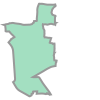

In [10]:
pin = '560016'

# Printing district and locality(post_office name)
pin_filt = pincodes['pincode'] == pin
print(pincodes.loc[pin_filt, ['district', 'officename']])

# Pin code mapping
pincode_map[pin]

# Plotting only Banglore in terms of pincode in Geopandas 

In [60]:
# Filtering only Banglore from the pincode shape file
state_filt = (pincodes['state'] == 'Karnataka') & (pincodes['district'] == 'Bangalore')
pincode_wo_office = pincodes[state_filt].drop(columns='officetype')
pincode_wo_office

,pincode,state,district,officename,geometry
1071,560056,Karnataka,Bangalore,Bnagalore Viswavidalaya,"POLYGON ((77.52018 12.95239, 77.52019 12.95237..."
3670,560011,Karnataka,Bangalore,Jayangar III Block,"POLYGON ((77.58009 12.93669, 77.58062 12.93668..."
3671,560002,Karnataka,Bangalore,Sri Jayachamarajendra Road,"POLYGON ((77.5745 12.95974, 77.57406 12.9599, ..."
3672,560017,Karnataka,Bangalore,NAL,"POLYGON ((77.67175 12.94089, 77.67136 12.94028..."
3674,560003,Karnataka,Bangalore,Malleswaram,"POLYGON ((77.56012 13.00773, 77.56047 13.00771..."
...,...,...,...,...,...
16595,560078,Karnataka,Bangalore,J P Nagar,"POLYGON ((77.56732 12.91226, 77.56702 12.91262..."
16979,560016,Karnataka,Bangalore,Krishnarajapuram R S,"POLYGON ((77.65968 13.02507, 77.65995 13.02536..."
16980,562149,Karnataka,Bangalore,Bagalur (Bangalore),"POLYGON ((77.65476 13.08722, 77.65422 13.0872,..."
16989,560022,Karnataka,Bangalore,Yeshwanthpur Bazar,"POLYGON ((77.52848 13.02099, 77.53064 13.02572..."


In [63]:
import geodatasets

pincode_wo_office.explore(
    # column=('officetype'),  # make choropleth based on "BoroName" column
    tooltip='officename',  # show "BoroName" value in tooltip (on hover)
    popup=['pincode'],  # show all values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap="Set1",  # use "Set1" matplotlib colormap or "RdYlGn"
    # style_kwds=dict(color="black"),  # use black outline
    name='District - Salem'
)

# BBMP(Banglore) Ward data
##### Shapefile Source: https://kgis.ksrsac.in/kgis/downloads.aspx
##### Town/Ward Boundaries --> Shapefile

In [27]:
bbmp_shape = gpd.read_file('2003_Bbmp/2003_BBMP.shp')
bbmp_shape

,KGISWardID,KGISWardCo,LGD_WardCo,KGISWardNo,KGISWardNa,KGISTownCo,created_us,created_da,last_edite,last_edi_1,SHAPE_STAr,SHAPE_STLe,geometry
0,4878,2003001,1303139,1,Kempegowda Ward,2003,SA,2021-10-22,SA,2022-01-28,1.071622e+07,21217.843000,"POLYGON ((783416.55 1452854.35, 783332.35 1452..."
1,4879,2003002,1303140,2,Chowdeshwari Ward,2003,SA,2021-10-22,SA,2022-01-28,6.719021e+06,16640.050671,"POLYGON ((780220.627 1453322.204, 780224.719 1..."
2,4882,2003003,1303141,3,Atturu,2003,SA,2021-10-22,SA,2022-01-28,8.813568e+06,20995.001881,"POLYGON ((778732.39 1452410.314, 778791.831 14..."
3,4883,2003004,1303142,4,Yelahanka Satellite Town,2003,SA,2021-10-22,SA,2022-01-28,4.437765e+06,10697.050783,"POLYGON ((781092.834 1449317.913, 781095.135 1..."
4,4886,2003005,1303143,5,Jakkuru,2003,SA,2021-10-22,SA,2022-01-28,2.254406e+07,27522.523456,"POLYGON ((786989.176 1448068.507, 786941.771 1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,5263,2003194,1302866,194,Gottigere,2003,SA,2021-10-22,SURESHBV1,2022-08-06,7.603506e+06,18178.103083,"POLYGON ((781360.497 1424362.417, 781356.979 1..."
194,5266,2003195,1302867,195,Konanakunte,2003,SA,2021-10-22,SA,2022-01-28,3.418331e+06,9239.950886,"POLYGON ((779928.404 1427139.593, 779922.15 14..."
195,5267,2003196,1302868,196,Anjanapura,2003,SA,2021-10-22,SA,2022-01-28,1.167297e+07,22135.146145,"POLYGON ((779706.696 1424895.731, 779658.888 1..."
196,5270,2003197,1302869,197,Vasanthpura,2003,SA,2021-10-22,SA,2022-01-28,5.868120e+06,21209.743034,"MULTIPOLYGON (((777117.4 1427827.561, 777163.6..."


In [64]:
import geodatasets

bbmp_shape.explore(
    column='KGISWardNo',  # make choropleth based on "BoroName" column
    tooltip='KGISWardNa',  # show "BoroName" value in tooltip (on hover)
    popup=['KGISWardNa', 'KGISWardNo', 'KGISWardID'],  # show all values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap="RdYlGn",  # use "Set1" matplotlib colormap
    style_kwds=dict(color="black"),  # use black outline
    name='BBMP Ward Details',
    legend=False
)

# Projecting Ward data onto the Banglore pincode shape to find wards with pincodes 

In [65]:
# Reprojecting BBMP's Coordinate Reference System onto Pincode shapes to overlay it further
bbmp_reprojected = bbmp_shape.to_crs(pincode_wo_office.crs)
overlay_result = gpd.overlay(pincode_wo_office, bbmp_reprojected, how='union')

C:\Users\krish\AppData\Local\Temp\ipykernel_10604\4201643415.py:3: UserWarning: `keep_geom_type=True` in overlay resulted in 225 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  overlay_result = gpd.overlay(pincode_wo_office, bbmp_reprojected, how='union')


In [62]:
overlay_result.explore(
    column='KGISWardNo',  # make choropleth based on "BoroName" column
    tooltip='district',  # show "BoroName" value in tooltip (on hover)
    popup=['KGISWardNa', 'district', 'pincode', 'KGISWardNo', 'KGISWardID'],  # show all values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap="RdYlGn",  # use "Set1" matplotlib colormap
    style_kwds=dict(color="black"),  # use black outline
    name='BBMP Ward Details',
    legend=False
)